# CE 295 - Energy Systems and Control
## Ursan Tchouteng Njike, SID 3033216253
## Prof. Daniel Arnold
## Due Date 04/19/2021

## Ursan_Tchouteng_Njike_HW4.ipynb

***
##  HW 4 : Forecasting Residential Electricity Power Consumption
***

## Problem 1

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('HW4_Train_Data.csv')

In [2]:
df

,UNIX Timestamp (seconds),"Start Time (GMT-0800,PST)","End Time (GMT-0800,PST)",Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg6 (kWh),Bldg7 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,1388851200,1/5/14 00:00,1/5/14 00:59,0.19,0.97,0.03,0.02,0.26,1.47,0.10,...,0.24,1.76,0.11,0.09,0.61,0.03,1.70,3.23,0.14,0.99
1,1388854800,1/5/14 01:00,1/5/14 01:59,0.19,0.83,0.10,0.02,0.26,1.48,0.20,...,0.40,1.49,0.06,0.10,0.77,0.03,1.78,2.42,0.12,0.93
2,1388858400,1/5/14 02:00,1/5/14 02:59,0.19,0.89,0.08,0.08,0.24,1.45,0.10,...,0.36,1.57,0.05,0.08,0.75,0.03,1.68,2.31,0.13,0.47
3,1388862000,1/5/14 03:00,1/5/14 03:59,0.19,0.83,0.03,0.02,0.17,1.45,0.18,...,0.33,1.31,0.06,0.13,0.34,0.02,1.70,2.72,0.14,0.58
4,1388865600,1/5/14 04:00,1/5/14 04:59,0.19,0.83,0.03,0.02,0.18,1.69,0.14,...,0.29,0.03,0.06,0.16,0.15,0.03,1.75,0.69,0.11,0.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8563,1419678000,12/27/14 19:00,12/27/14 19:59,0.31,1.27,0.07,0.02,0.06,3.10,0.53,...,0.08,0.05,0.05,0.08,0.37,0.02,2.32,1.25,0.09,0.15
8564,1419681600,12/27/14 20:00,12/27/14 20:59,0.25,1.30,0.08,0.06,0.26,3.36,3.08,...,0.07,0.00,0.05,0.06,1.18,0.02,2.09,1.24,0.10,0.17
8565,1419685200,12/27/14 21:00,12/27/14 21:59,0.14,1.12,0.04,0.02,0.30,1.89,2.20,...,0.09,0.00,0.05,0.07,0.62,0.02,1.64,1.22,0.10,0.15
8566,1419688800,12/27/14 22:00,12/27/14 22:59,0.14,1.09,0.08,0.02,0.29,1.44,0.92,...,0.06,0.05,0.01,0.07,0.36,0.03,1.29,1.22,0.10,0.16


In [3]:
df.columns

Index(['UNIX Timestamp (seconds)', 'Start Time (GMT-0800,PST)',
       'End Time (GMT-0800,PST)', 'Bldg1 (kWh)', 'Bldg2 (kWh)', 'Bldg3 (kWh)',
       'Bldg4 (kWh)', 'Bldg5 (kWh)', 'Bldg6 (kWh)', 'Bldg7 (kWh)',
       'Bldg8 (kWh)', 'Bldg9 (kWh)', 'Bldg10 (kWh)', 'Bldg11 (kWh)',
       'Bldg12 (kWh)', 'Bldg13 (kWh)', 'Bldg14 (kWh)', 'Bldg15 (kWh)',
       'Bldg16 (kWh)', 'Bldg17 (kWh)', 'Bldg18 (kWh)', 'Bldg19 (kWh)',
       'Bldg20 (kWh)', 'Bldg21 (kWh)', 'Bldg22 (kWh)', 'Bldg23 (kWh)'],
      dtype='object')

In [4]:
cols=['Bldg1 (kWh)', 'Bldg2 (kWh)', 'Bldg3 (kWh)',
       'Bldg4 (kWh)', 'Bldg5 (kWh)', 'Bldg6 (kWh)', 'Bldg7 (kWh)',
       'Bldg8 (kWh)', 'Bldg9 (kWh)', 'Bldg10 (kWh)', 'Bldg11 (kWh)',
       'Bldg12 (kWh)', 'Bldg13 (kWh)', 'Bldg14 (kWh)', 'Bldg15 (kWh)',
       'Bldg16 (kWh)', 'Bldg17 (kWh)', 'Bldg18 (kWh)', 'Bldg19 (kWh)',
       'Bldg20 (kWh)', 'Bldg21 (kWh)', 'Bldg22 (kWh)', 'Bldg23 (kWh)']
df_Bldg = df[cols]

In [5]:
df_Bldg

,Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg6 (kWh),Bldg7 (kWh),Bldg8 (kWh),Bldg9 (kWh),Bldg10 (kWh),...,Bldg14 (kWh),Bldg15 (kWh),Bldg16 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh)
0,0.19,0.97,0.03,0.02,0.26,1.47,0.10,0.10,0.34,0.07,...,0.24,1.76,0.11,0.09,0.61,0.03,1.70,3.23,0.14,0.99
1,0.19,0.83,0.10,0.02,0.26,1.48,0.20,0.11,0.22,0.11,...,0.40,1.49,0.06,0.10,0.77,0.03,1.78,2.42,0.12,0.93
2,0.19,0.89,0.08,0.08,0.24,1.45,0.10,0.11,0.22,0.06,...,0.36,1.57,0.05,0.08,0.75,0.03,1.68,2.31,0.13,0.47
3,0.19,0.83,0.03,0.02,0.17,1.45,0.18,0.11,0.22,0.11,...,0.33,1.31,0.06,0.13,0.34,0.02,1.70,2.72,0.14,0.58
4,0.19,0.83,0.03,0.02,0.18,1.69,0.14,0.09,0.21,0.06,...,0.29,0.03,0.06,0.16,0.15,0.03,1.75,0.69,0.11,0.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8563,0.31,1.27,0.07,0.02,0.06,3.10,0.53,0.25,0.06,0.07,...,0.08,0.05,0.05,0.08,0.37,0.02,2.32,1.25,0.09,0.15
8564,0.25,1.30,0.08,0.06,0.26,3.36,3.08,0.26,0.08,0.14,...,0.07,0.00,0.05,0.06,1.18,0.02,2.09,1.24,0.10,0.17
8565,0.14,1.12,0.04,0.02,0.30,1.89,2.20,0.15,0.05,0.07,...,0.09,0.00,0.05,0.07,0.62,0.02,1.64,1.22,0.10,0.15
8566,0.14,1.09,0.08,0.02,0.29,1.44,0.92,0.14,0.07,0.09,...,0.06,0.05,0.01,0.07,0.36,0.03,1.29,1.22,0.10,0.16


**(a)**

Text(0, 0.5, 'Average Energy Consumption (kWh)')

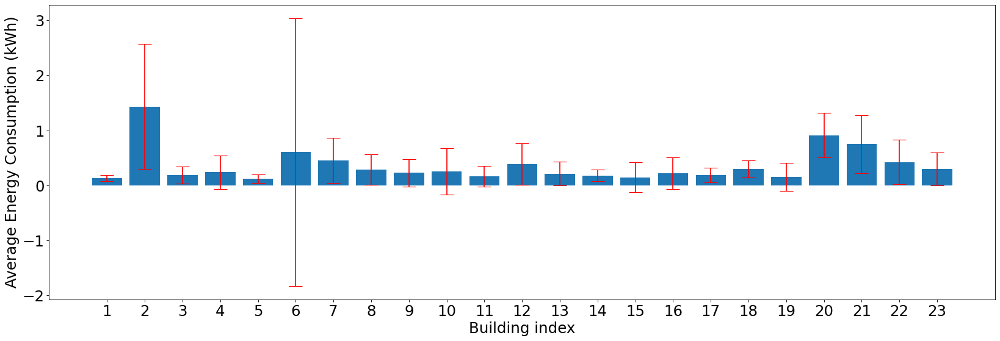

In [252]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k')
plt.rcParams.update({'font.size': 22})

bar=plt.bar(range(1,24), df_Bldg.mean(axis=0), yerr=df_Bldg.std(axis=0), capsize=10, ecolor='red')

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]

plt.xticks(j_idx)
plt.xlabel('Building index')
plt.ylabel('Average Energy Consumption (kWh)')

**(b)**

In [7]:
min_e = df_Bldg.mean(axis=0) - df_Bldg.std(axis=0)
min_e

Bldg1 (kWh)     0.072662
Bldg2 (kWh)     0.300053
Bldg3 (kWh)     0.032967
Bldg4 (kWh)    -0.065998
Bldg5 (kWh)     0.047595
Bldg6 (kWh)    -1.827369
Bldg7 (kWh)     0.043574
Bldg8 (kWh)     0.006648
Bldg9 (kWh)    -0.021268
Bldg10 (kWh)   -0.171929
Bldg11 (kWh)   -0.023374
Bldg12 (kWh)    0.007252
Bldg13 (kWh)   -0.003230
Bldg14 (kWh)    0.073149
Bldg15 (kWh)   -0.120477
Bldg16 (kWh)   -0.070027
Bldg17 (kWh)    0.050981
Bldg18 (kWh)    0.142915
Bldg19 (kWh)   -0.101940
Bldg20 (kWh)    0.506464
Bldg21 (kWh)    0.226024
Bldg22 (kWh)    0.017541
Bldg23 (kWh)   -0.003095
dtype: float64

**From the evaluation above, Bldg4, Bldg6, Bldg9, Bldg10, Bldg11, Bldg13, Bldg15, Bldg16, Bldg18, and Bldg23 should have solar panels**

**(c)**

In [8]:
To_drop = ['Bldg4 (kWh)','Bldg6 (kWh)', 'Bldg9 (kWh)','Bldg10 (kWh)', 'Bldg11 (kWh)','Bldg13 (kWh)', 'Bldg15 (kWh)','Bldg16 (kWh)', 'Bldg19 (kWh)', 'Bldg23 (kWh)']
df_Bldg_useful = df_Bldg.drop(To_drop, axis=1)
hour=[]
for i in range(len(df_Bldg_useful)):
    hour.append(i%24+1)
day=[1]
d=0
for i in range(1,len(df_Bldg_useful)):
    if i%24 == 0:
        d+=1
    day.append(d%7+1)
        
w=0
week=[1]
for i in range(1,len(df_Bldg_useful)):
    if i%(24*7)==0:
        w+=1
    week.append(w%52+1)
df_Bldg_useful['HoD']=hour
df_Bldg_useful['DoW']=day
df_Bldg_useful['WoY']=week

df_Bldg_useful

,Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg5 (kWh),Bldg7 (kWh),Bldg8 (kWh),Bldg12 (kWh),Bldg14 (kWh),Bldg17 (kWh),Bldg18 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),HoD,DoW,WoY
0,0.19,0.97,0.03,0.26,0.10,0.10,0.20,0.24,0.09,0.61,1.70,3.23,0.14,1,1,1
1,0.19,0.83,0.10,0.26,0.20,0.11,0.10,0.40,0.10,0.77,1.78,2.42,0.12,2,1,1
2,0.19,0.89,0.08,0.24,0.10,0.11,0.13,0.36,0.08,0.75,1.68,2.31,0.13,3,1,1
3,0.19,0.83,0.03,0.17,0.18,0.11,0.11,0.33,0.13,0.34,1.70,2.72,0.14,4,1,1
4,0.19,0.83,0.03,0.18,0.14,0.09,0.10,0.29,0.16,0.15,1.75,0.69,0.11,5,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8563,0.31,1.27,0.07,0.06,0.53,0.25,0.67,0.08,0.08,0.37,2.32,1.25,0.09,20,7,51
8564,0.25,1.30,0.08,0.26,3.08,0.26,0.86,0.07,0.06,1.18,2.09,1.24,0.10,21,7,51
8565,0.14,1.12,0.04,0.30,2.20,0.15,0.56,0.09,0.07,0.62,1.64,1.22,0.10,22,7,51
8566,0.14,1.09,0.08,0.29,0.92,0.14,0.67,0.06,0.07,0.36,1.29,1.22,0.10,23,7,51


In [9]:
df_Bldg_useful.columns

Index(['Bldg1 (kWh)', 'Bldg2 (kWh)', 'Bldg3 (kWh)', 'Bldg5 (kWh)',
       'Bldg7 (kWh)', 'Bldg8 (kWh)', 'Bldg12 (kWh)', 'Bldg14 (kWh)',
       'Bldg17 (kWh)', 'Bldg18 (kWh)', 'Bldg20 (kWh)', 'Bldg21 (kWh)',
       'Bldg22 (kWh)', 'HoD', 'DoW', 'WoY'],
      dtype='object')

In [10]:
df_Bldg_useful[['Bldg1', 'Bldg2', 'Bldg3', 'Bldg5',
       'Bldg7', 'Bldg8', 'Bldg12', 'Bldg14',
       'Bldg17', 'Bldg18', 'Bldg20', 'Bldg21',
       'Bldg22']] = df_Bldg_useful[['Bldg1 (kWh)', 'Bldg2 (kWh)', 'Bldg3 (kWh)', 'Bldg5 (kWh)', 'Bldg7 (kWh)', 'Bldg8 (kWh)', 'Bldg12 (kWh)', 'Bldg14 (kWh)','Bldg17 (kWh)', 'Bldg18 (kWh)', 'Bldg20 (kWh)', 'Bldg21 (kWh)','Bldg22 (kWh)']]
df_Bldg_useful = df_Bldg_useful.drop(['Bldg1 (kWh)', 'Bldg2 (kWh)', 'Bldg3 (kWh)', 'Bldg5 (kWh)',
       'Bldg7 (kWh)', 'Bldg8 (kWh)', 'Bldg12 (kWh)', 'Bldg14 (kWh)',
       'Bldg17 (kWh)', 'Bldg18 (kWh)', 'Bldg20 (kWh)', 'Bldg21 (kWh)',
       'Bldg22 (kWh)'], axis=1)

In [11]:
df_Bldg_useful['id']=df_Bldg_useful.index

In [12]:
df_long = pd.wide_to_long(df_Bldg_useful, ['Bldg'], i="id", j="Bld")

In [13]:
df_long

,,DoW,WoY,HoD,Bldg
id,Bld,,,,
0,1,1,1,1,0.19
1,1,1,1,2,0.19
2,1,1,1,3,0.19
3,1,1,1,4,0.19
4,1,1,1,5,0.19
...,...,...,...,...,...
8563,22,7,51,20,0.09
8564,22,7,51,21,0.10
8565,22,7,51,22,0.10


In [14]:
df_long = df_long.droplevel(level = 0)

NormValues = []
for i in df_long.index.unique():
    NormValues += list(df_long[df_long.index==i]['Bldg']/df_long[df_long.index==i]['Bldg'].max())

df_long['NormValues'] = NormValues 
df_long

,DoW,WoY,HoD,Bldg,NormValues
Bld,,,,,
1,1,1,1,0.19,0.234568
1,1,1,2,0.19,0.234568
1,1,1,3,0.19,0.234568
1,1,1,4,0.19,0.234568
1,1,1,5,0.19,0.234568
...,...,...,...,...,...
22,7,51,20,0.09,0.026706
22,7,51,21,0.10,0.029674
22,7,51,22,0.10,0.029674


**The table above represents the 4D dataset**

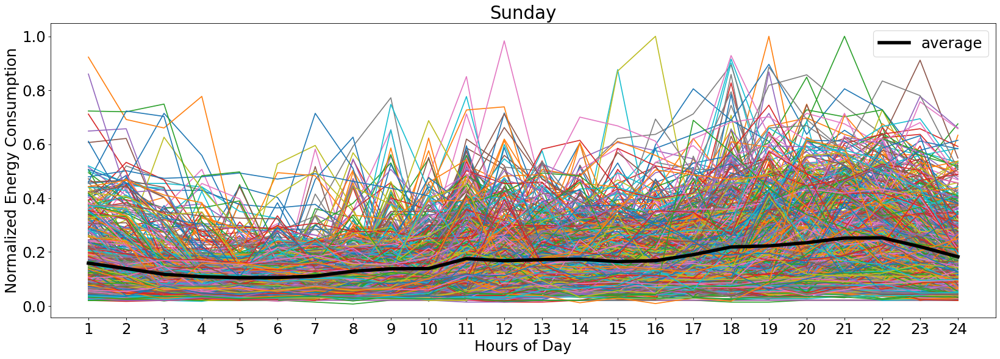

In [236]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

df_HoD_DoW1 = pd.DataFrame()
for i in df_long.index.unique():
    for j in df_long['WoY'].unique():
        x=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==1]['HoD']
        y=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==1]['NormValues']
        plt.plot(x,y)
    df_HoD_DoW1[i]=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==1].groupby(['HoD']).mean()['NormValues']
    
j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
y=df_long[df_long['DoW']==1].groupby(['HoD']).mean()['NormValues']
plt.plot(x,y, label='average', linewidth=5, color='black')

plt.xticks(j_idx)
plt.xlim(0,25)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Sunday')
plt.legend()

### **Sunday Plot**

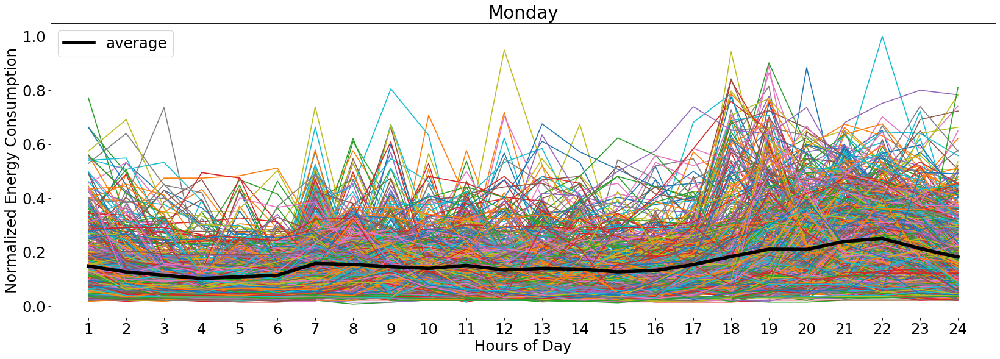

In [237]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

df_HoD_DoW2 = pd.DataFrame()
for i in df_long.index.unique():
    for j in df_long['WoY'].unique():
        x=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==2]['HoD']
        y=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==2]['NormValues']
        plt.plot(x,y)
    df_HoD_DoW2[i]=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==2].groupby(['HoD']).mean()['NormValues']
    
j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
y=df_long[df_long['DoW']==2].groupby(['HoD']).mean()['NormValues']
plt.plot(x,y, label='average', linewidth=5, color='black')

plt.xticks(j_idx)
plt.xlim(0,25)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Monday')
plt.legend()

### **Monday Plot**

Text(0.5, 1.0, 'Tuesday')

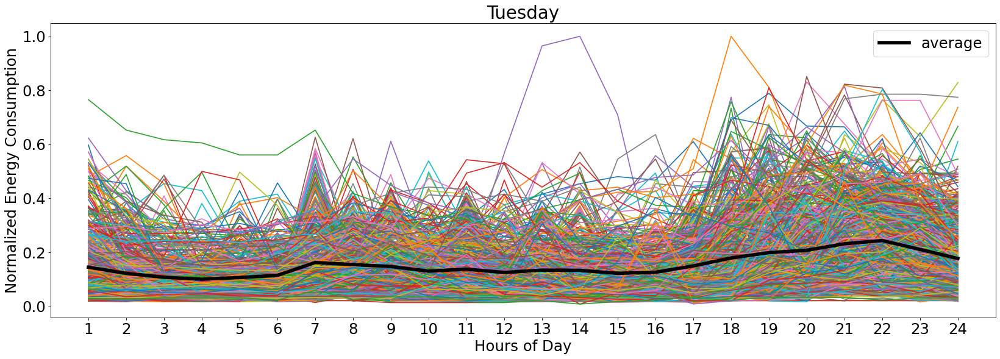

In [238]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

df_HoD_DoW3 = pd.DataFrame()
for i in df_long.index.unique():
    for j in df_long['WoY'].unique():
        x=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==3]['HoD']
        y=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==3]['NormValues']
        plt.plot(x,y)
    df_HoD_DoW3[i]=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==3].groupby(['HoD']).mean()['NormValues']
    
j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
y=df_long[df_long['DoW']==3].groupby(['HoD']).mean()['NormValues']
plt.plot(x,y, label='average', linewidth=5, color='black')

plt.xticks(j_idx)
plt.xlim(0,25)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.legend()
plt.title('Tuesday')

### **Tuesday Plot**

Text(0.5, 1.0, 'Wednesday')

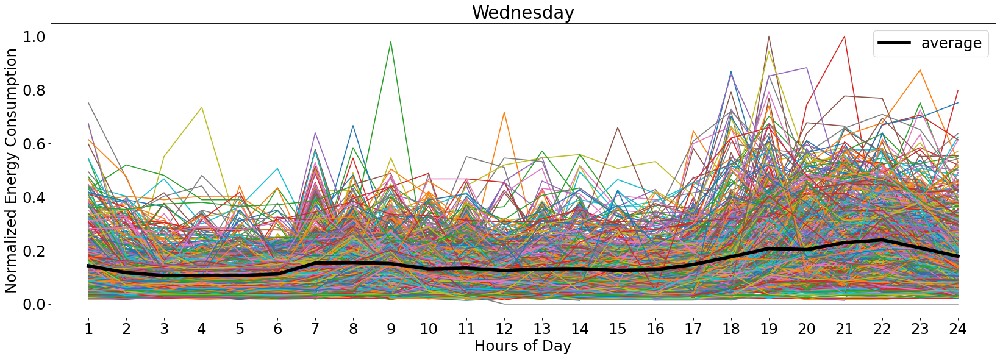

In [239]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

df_HoD_DoW4 = pd.DataFrame()
for i in df_long.index.unique():
    for j in df_long['WoY'].unique():
        x=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==4]['HoD']
        y=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==4]['NormValues']
        plt.plot(x,y)
    df_HoD_DoW4[i]=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==4].groupby(['HoD']).mean()['NormValues']
    
j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
y=df_long[df_long['DoW']==4].groupby(['HoD']).mean()['NormValues']
plt.plot(x,y, label='average', linewidth=5, color='black')

plt.xticks(j_idx)
plt.xlim(0,25)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.legend()
plt.title('Wednesday')

### **Wednesday Plot**

Text(0.5, 1.0, 'Thursday')

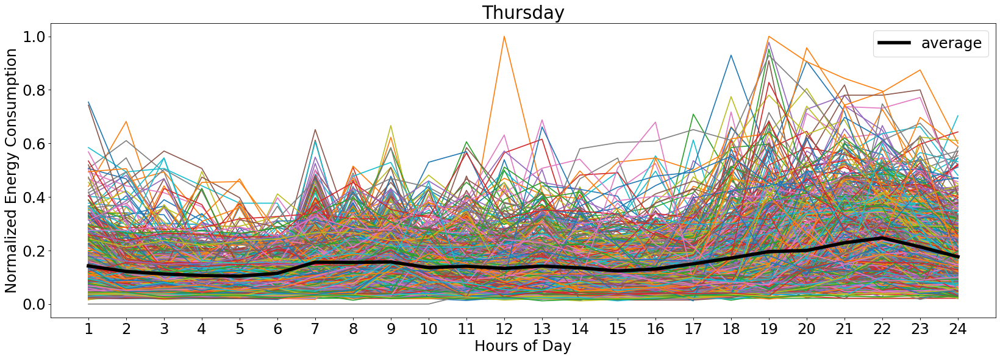

In [240]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

df_HoD_DoW5 = pd.DataFrame()
for i in df_long.index.unique():
    for j in df_long['WoY'].unique():
        x=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==5]['HoD']
        y=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==5]['NormValues']
        plt.plot(x,y)
    df_HoD_DoW5[i]=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==5].groupby(['HoD']).mean()['NormValues']
    
j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
y=df_long[df_long['DoW']==5].groupby(['HoD']).mean()['NormValues']
plt.plot(x,y, label='average', linewidth=5, color='black')

plt.xticks(j_idx)
plt.xlim(0,25)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.legend()
plt.title('Thursday')

### **Thursday Plot**

Text(0.5, 1.0, 'Friday')

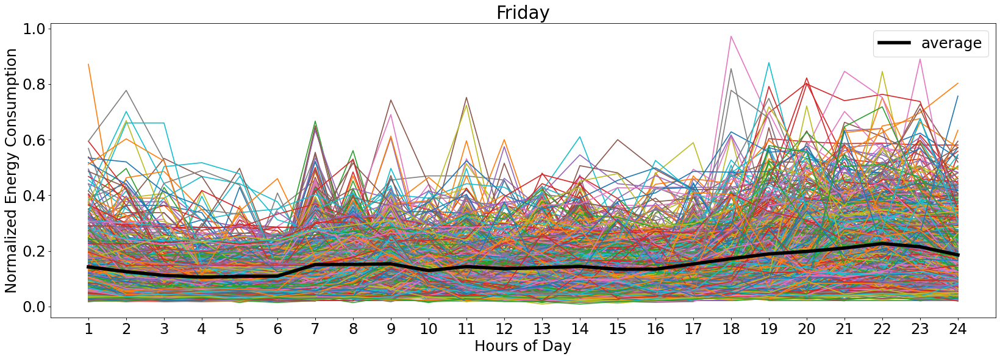

In [241]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

df_HoD_DoW6 = pd.DataFrame()
for i in df_long.index.unique():
    for j in df_long['WoY'].unique():
        x=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==6]['HoD']
        y=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==6]['NormValues']
        plt.plot(x,y)
    df_HoD_DoW6[i]=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==6].groupby(['HoD']).mean()['NormValues']
    
j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
y=df_long[df_long['DoW']==6].groupby(['HoD']).mean()['NormValues']
plt.plot(x,y, label='average', linewidth=5, color='black')

plt.xticks(j_idx)
plt.xlim(0,25)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.legend()
plt.title('Friday')

### **Friday Plot**

Text(0.5, 1.0, 'Saturday')

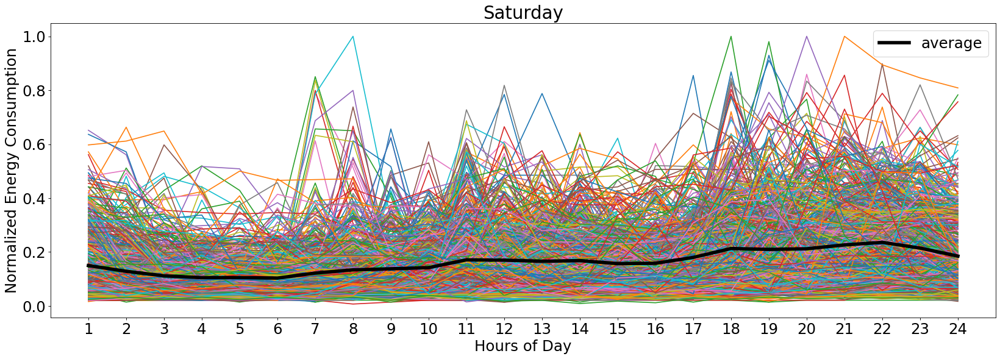

In [244]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

df_HoD_DoW7 = pd.DataFrame()
for i in df_long.index.unique():
    for j in df_long['WoY'].unique():
        x=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==7]['HoD']
        y=df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j][df_long[df_long.index==i][df_long[df_long.index==i]['WoY']==j]['DoW']==7]['NormValues']
        plt.plot(x,y)
    df_HoD_DoW7[i]=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==7].groupby(['HoD']).mean()['NormValues']
    
j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
y=df_long[df_long['DoW']==7].groupby(['HoD']).mean()['NormValues']
plt.plot(x,y, label='average', linewidth=5, color='black')

plt.xticks(j_idx)
plt.xlim(0,25)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.legend()
plt.title('Saturday')

### **Saturday Plot**

## Problem 2

In [245]:
Sun_hour = df_HoD_DoW1.mean(axis=1)
Mon_hour = df_HoD_DoW2.mean(axis=1)
Tue_hour = df_HoD_DoW3.mean(axis=1)
Wed_hour = df_HoD_DoW4.mean(axis=1)
Thu_hour = df_HoD_DoW5.mean(axis=1)
Fri_hour = df_HoD_DoW6.mean(axis=1)
Sat_hour = df_HoD_DoW7.mean(axis=1)

df_smodel = pd.concat([Sun_hour, Mon_hour, Tue_hour, Wed_hour, Thu_hour, Fri_hour, Sat_hour], axis=1)
df_smodel

,0,1,2,3,4,5,6
HoD,,,,,,,
1,0.158667,0.148017,0.145277,0.142611,0.142289,0.142361,0.149831
2,0.138553,0.125888,0.122562,0.117183,0.121745,0.125340,0.128467
3,0.117410,0.113630,0.107890,0.106173,0.112275,0.111959,0.111675
4,0.108281,0.101573,0.100852,0.105705,0.106430,0.105676,0.105077
5,0.104420,0.108242,0.107081,0.106465,0.104308,0.108534,0.105163
6,0.104974,0.113532,0.115180,0.111853,0.114717,0.109226,0.103310
7,0.111053,0.157368,0.162531,0.152900,0.156408,0.150773,0.121994
8,0.129015,0.153819,0.154754,0.154875,0.155340,0.151427,0.133822
9,0.137826,0.145646,0.147890,0.150732,0.157156,0.153311,0.137790


In [23]:
df_test = pd.read_csv('HW4_Test_Data.csv')
df_test

,TestTime,TestBldg
0,9/7/14 00:00,0.094276
1,9/7/14 01:00,0.037037
2,9/7/14 02:00,0.040404
3,9/7/14 03:00,0.037037
4,9/7/14 04:00,0.037037
...,...,...
163,9/13/14 19:00,0.164983
164,9/13/14 20:00,0.235690
165,9/13/14 21:00,0.185185
166,9/13/14 22:00,0.168350


In [24]:
hour=[]
for i in range(len(df_test)):
    hour.append(i%24+1)
day=[1]
d=0
for i in range(1,len(df_test)):
    if i%24 == 0:
        d+=1
    day.append(d%7+1)
        
w=0
week=[1]
for i in range(1,len(df_test)):
    if i%(24*7)==0:
        w+=1
    week.append(w%52+1)
df_test['HoD']=hour
df_test['DoW']=day
df_test['WoY']=week

df_test

,TestTime,TestBldg,HoD,DoW,WoY
0,9/7/14 00:00,0.094276,1,1,1
1,9/7/14 01:00,0.037037,2,1,1
2,9/7/14 02:00,0.040404,3,1,1
3,9/7/14 03:00,0.037037,4,1,1
4,9/7/14 04:00,0.037037,5,1,1
...,...,...,...,...,...
163,9/13/14 19:00,0.164983,20,7,1
164,9/13/14 20:00,0.235690,21,7,1
165,9/13/14 21:00,0.185185,22,7,1
166,9/13/14 22:00,0.168350,23,7,1


In [25]:
Pred = []
for i in range(len(df_test)):
    Pred.append(df_smodel.iloc[df_test['HoD'][i]-1,df_test['DoW'][i]-1])
df_test['Pred']=Pred

# NormTest = []
# for i in range(1,8):
#     NormTest+=list(df_test[df_test['DoW']==i]['TestBldg']/df_test[df_test['DoW']==i]['TestBldg'].max())

# NormTest
# df_test['NormTest']=NormTest
df_test

,TestTime,TestBldg,HoD,DoW,WoY,Pred
0,9/7/14 00:00,0.094276,1,1,1,0.158667
1,9/7/14 01:00,0.037037,2,1,1,0.138553
2,9/7/14 02:00,0.040404,3,1,1,0.117410
3,9/7/14 03:00,0.037037,4,1,1,0.108281
4,9/7/14 04:00,0.037037,5,1,1,0.104420
...,...,...,...,...,...,...
163,9/13/14 19:00,0.164983,20,7,1,0.212035
164,9/13/14 20:00,0.235690,21,7,1,0.226399
165,9/13/14 21:00,0.185185,22,7,1,0.235849
166,9/13/14 22:00,0.168350,23,7,1,0.214539


MAE:  0.09744274492563047


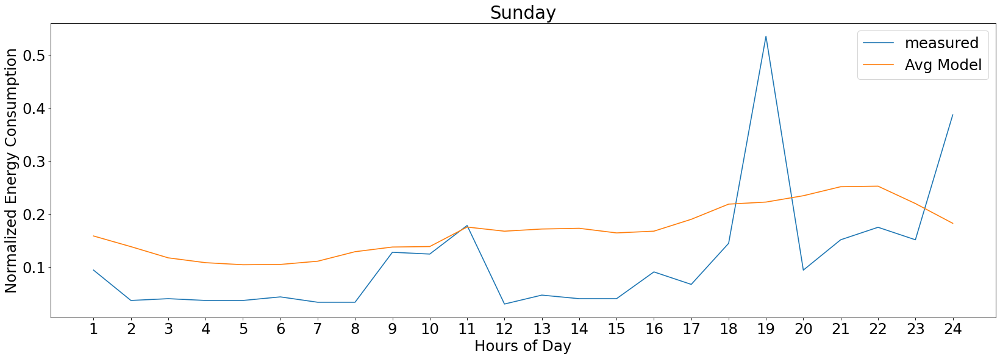

In [253]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['Pred'], label= 'Avg Model')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Sunday')

sum_er = 0
n=0
for i in range(len(df_test[df_test['DoW']==1])):
    sum_er += abs(df_test[df_test['DoW']==1]['TestBldg'][i]-df_test[df_test['DoW']==1]['Pred'][i])
    n+=1
    
MAE = sum_er/len(df_test[df_test['DoW']==1])
print('MAE: ', MAE) 

### **Sunday Plot**

MAE:  0.11112996935724223


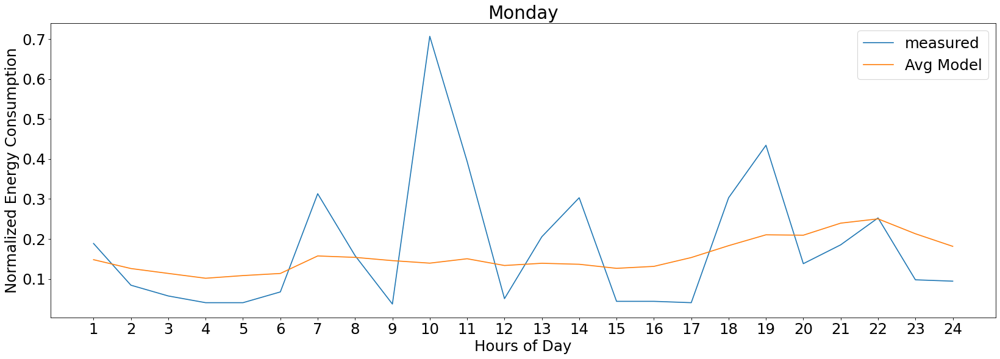

In [254]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['Pred'], label= 'Avg Model')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Monday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==2])):
    sum_er += abs(df_test[df_test['DoW']==2]['TestBldg'][n+i]-df_test[df_test['DoW']==2]['Pred'][n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==2])
print('MAE: ', MAE) 

### **Monday Plot**

MAE:  0.08764351590582777


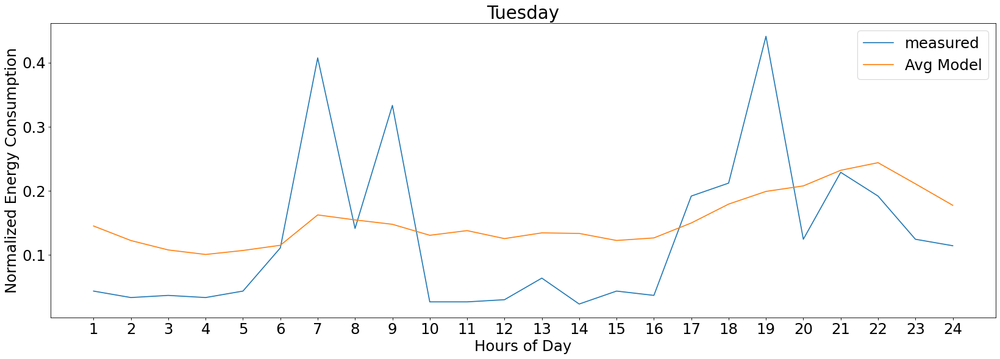

In [255]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['Pred'], label= 'Avg Model')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Tuesday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==3])):
    sum_er += abs(df_test[df_test['DoW']==3]['TestBldg'][2*n+i]-df_test[df_test['DoW']==3]['Pred'][2*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==3])
print('MAE: ', MAE) 

### **Tuesday Plot**

MAE:  0.10069344896443289


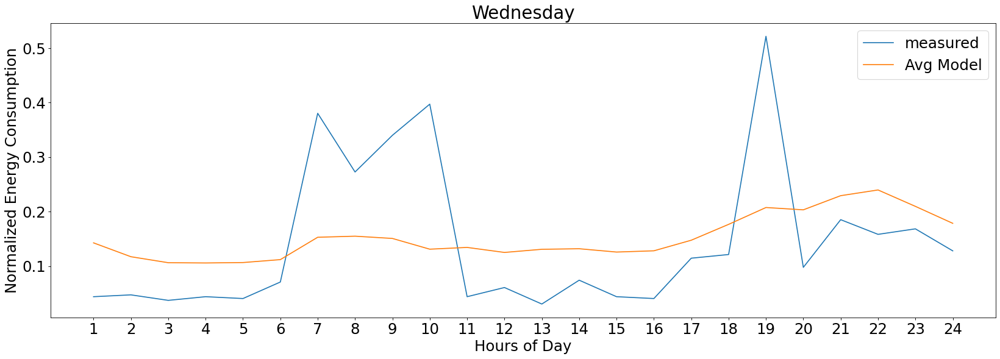

In [256]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['Pred'], label= 'Avg Model')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Wednesday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==4])):
    sum_er += abs(df_test[df_test['DoW']==4]['TestBldg'][3*n+i]-df_test[df_test['DoW']==4]['Pred'][3*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==4])
print('MAE: ', MAE) 

### **Wednesday Plot**

MAE:  0.07006082528061262


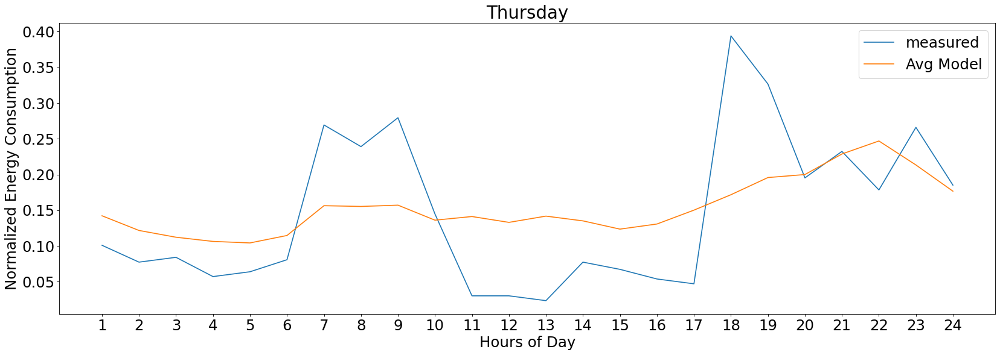

In [257]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['Pred'], label= 'Avg Model')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Thursday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==5])):
    sum_er += abs(df_test[df_test['DoW']==5]['TestBldg'][4*n+i]-df_test[df_test['DoW']==5]['Pred'][4*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==5])
print('MAE: ', MAE) 

### **Thursday Plot**

MAE:  0.07514645920548045


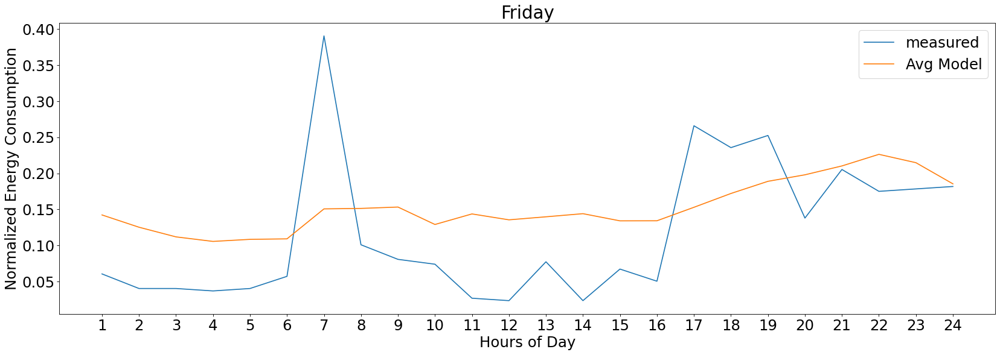

In [258]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['Pred'], label= 'Avg Model')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Friday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==6])):
    sum_er += abs(df_test[df_test['DoW']==6]['TestBldg'][5*n+i]-df_test[df_test['DoW']==6]['Pred'][5*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==6])
print('MAE: ', MAE) 

### **Friday Plot**

MAE:  0.09029475040204783


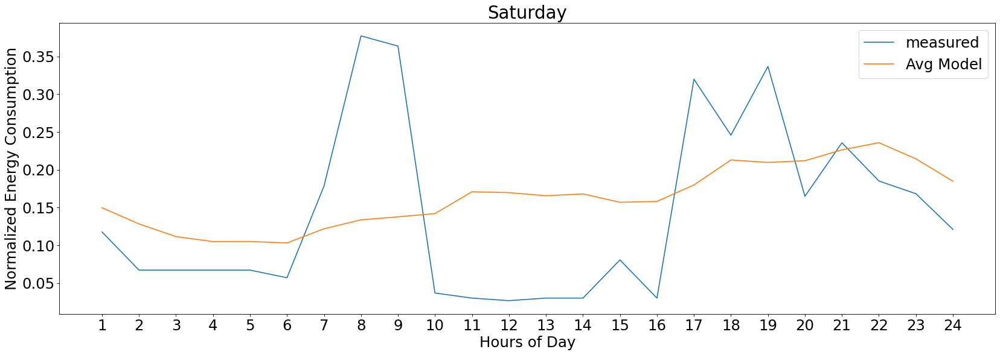

In [259]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['Pred'], label= 'Avg Model')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Saturday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==7])):
    sum_er += abs(df_test[df_test['DoW']==7]['TestBldg'][6*n+i]-df_test[df_test['DoW']==7]['Pred'][6*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==7])
print('MAE: ', MAE) 

### **Saturday Plot**

In [260]:
sum_er = 0
for i in range(len(df_test)):
    sum_er += abs(df_test['TestBldg'][i]-df_test['Pred'][i])
    
MAE = sum_er/len(df_test)
print('Avg Model MAE: ', MAE)

Avg Model MAE:  0.09034453057732487


DoW with highest MAE: **Monday** 0.111


DoW with lowest MAE: **Thursday** 0.0701

## Problem 3

**(a)**

$Y = \Phi \theta$

Where,

$Y = \begin{bmatrix} \hat{P}(k) - \hat{P}_{avg}(k) \\ \hat{P}(k+1) - \hat{P}_{avg}(k+1) \\ : \\ \hat{P}(k+164) - \hat{P}_{avg}(k+164) \end{bmatrix}$

$\Phi = \begin{bmatrix} P(k-1) & P(k-2) & .. & P(k-l) \\ P(k) & P(k-1) & .. & P(k-l+1) \\ : & : & & : \\ P(k+163) & P(k+162) & .. & P(k-l+164) \end{bmatrix} $

$\theta = [\alpha_1,\alpha_2, ..., \alpha_l]^T$ 

**(b)**

$r = \Phi \theta - Y$

The least square optimization problem is therefore,

$\frac12||r||^2 = \frac12 (\Phi \theta - Y)^T(\Phi \theta - Y)$

Object function,

$^{min}_{\space \theta} \space\space\space \frac12 (\Phi \theta - Y)^T(\Phi \theta - Y)$  with the notation as described in part (a)

This is a convex program because the objective function is convex and unconstrained.

**(c)**

for L=3,

$^{min}_{\space \theta} \frac12  (\Phi \theta - Y)^T(\Phi \theta - Y)$

where,

$\Phi = \begin{bmatrix} P(k-1) & P(k-2) & P(k-3) \\ P(k) & P(k-1) & P(k-2) \\ : & : & : \\ P(k+163) & P(k+162) & P(k+161) \end{bmatrix}$ 

$\theta = \begin{bmatrix} \alpha_1 \\ \alpha_2 \\ \alpha_3 \end{bmatrix}$

and 

$Y = \begin{bmatrix} \hat{P}(k) - \hat{P}_{avg}(k) \\ \hat{P}(k+1) - \hat{P}_{avg}(k+1) \\ : \\ \hat{P}(k+164) - \hat{P}_{avg}(k+164) \end{bmatrix}$

simplifying the problem yields,

$\theta = (\Phi^T \Phi)^{-1}\Phi^TY$

In [34]:
m1data = []
m2data = []
m3data = []
y=[]
    
for d in range(1,8):    
    for i in df_long.index.unique():

        m1=df_long[df_long.index==i][df_long[df_long.index==i]['DoW']==d].groupby(['HoD']).mean()['NormValues']
        for h in range(4,24):
            m1data.append(m1[h-1])
            m2data.append(m1[h-2])
            m3data.append(m1[h-3])
            y.append(m1[h] - df_smodel.iloc[h-1,d-1])
    
phi = np.matrix([m1data,m2data,m3data]).T
Y = np.matrix(y).T
print(phi)
print(Y)

[[0.13071895 0.14984265 0.16122004]
 [0.12999274 0.13071895 0.14984265]
 [0.13217139 0.12999274 0.13071895]
 ...
 [0.19962763 0.23017397 0.16652121]
 [0.19607843 0.19962763 0.23017397]
 [0.18531448 0.19607843 0.19962763]]
[[ 0.0217115 ]
 [ 0.02775112]
 [ 0.02792394]
 ...
 [-0.03032035]
 [-0.05053448]
 [-0.02817765]]


In [35]:
theta = np.linalg.inv(phi.T*phi)*phi.T*Y
theta

matrix([[ 0.38598663],
        [-0.12549411],
        [-0.17689618]])

**The optimal values of alphas are $\alpha_1^{\star} = 0.38598663$, $\alpha_2^{\star} = -0.12549411$, and $\alpha_3^{\star} = -0.17689618$**

**(d)**

In [37]:
df_test

,TestTime,TestBldg,HoD,DoW,WoY,Pred
0,9/7/14 00:00,0.094276,1,1,1,0.158667
1,9/7/14 01:00,0.037037,2,1,1,0.138553
2,9/7/14 02:00,0.040404,3,1,1,0.117410
3,9/7/14 03:00,0.037037,4,1,1,0.108281
4,9/7/14 04:00,0.037037,5,1,1,0.104420
...,...,...,...,...,...,...
163,9/13/14 19:00,0.164983,20,7,1,0.212035
164,9/13/14 20:00,0.235690,21,7,1,0.226399
165,9/13/14 21:00,0.185185,22,7,1,0.235849
166,9/13/14 22:00,0.168350,23,7,1,0.214539


In [38]:
Arx = [df_test['TestBldg'][0],df_test['TestBldg'][1],df_test['TestBldg'][2]]
for i in range(3, len(df_test)):
    Arx.append((Arx[i-1]*theta[0]+Arx[i-2]*theta[1]+ Arx[i-3]*theta[2] + df_smodel.iloc[df_test['HoD'][i]-1,df_test['DoW'][i]-1]).item(0))
df_test['Arx']=Arx
df_test

,TestTime,TestBldg,HoD,DoW,WoY,Pred,Arx
0,9/7/14 00:00,0.094276,1,1,1,0.158667,0.094276
1,9/7/14 01:00,0.037037,2,1,1,0.138553,0.037037
2,9/7/14 02:00,0.040404,3,1,1,0.117410,0.040404
3,9/7/14 03:00,0.037037,4,1,1,0.108281,0.102552
4,9/7/14 04:00,0.037037,5,1,1,0.104420,0.132382
...,...,...,...,...,...,...,...
163,9/13/14 19:00,0.164983,20,7,1,0.212035,0.244102
164,9/13/14 20:00,0.235690,21,7,1,0.226399,0.247940
165,9/13/14 21:00,0.185185,22,7,1,0.235849,0.257207
166,9/13/14 22:00,0.168350,23,7,1,0.214539,0.239522


ARX MAE:  0.100743066418878


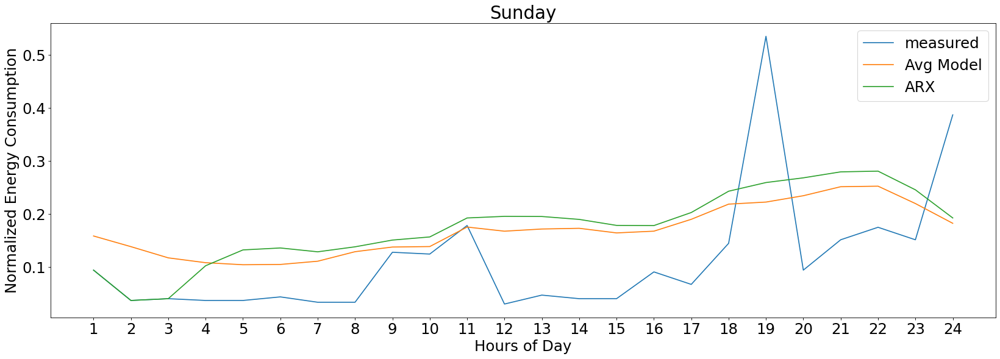

In [261]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['Arx'], label= 'ARX')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Sunday')

sum_er = 0
n=0
for i in range(len(df_test[df_test['DoW']==1])):
    sum_er += abs(df_test[df_test['DoW']==1]['TestBldg'][i]-df_test[df_test['DoW']==1]['Arx'][i])
    n+=1
    
MAE = sum_er/len(df_test[df_test['DoW']==1])
print('ARX MAE: ', MAE) 

### Sunday Plot

ARX MAE:  0.11630287284858602


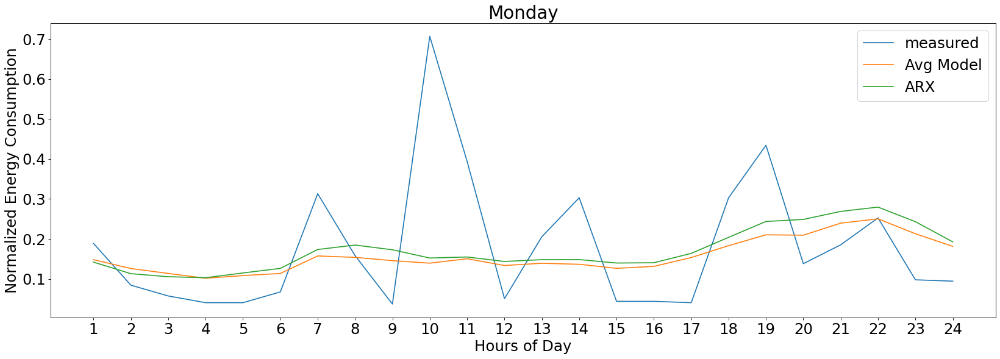

In [262]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['Arx'], label= 'ARX')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Monday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==2])):
    sum_er += abs(df_test[df_test['DoW']==2]['TestBldg'][n+i]-df_test[df_test['DoW']==2]['Arx'][n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==2])
print('ARX MAE: ', MAE) 

### **Monday Plot**

ARX MAE:  0.09267991199867864


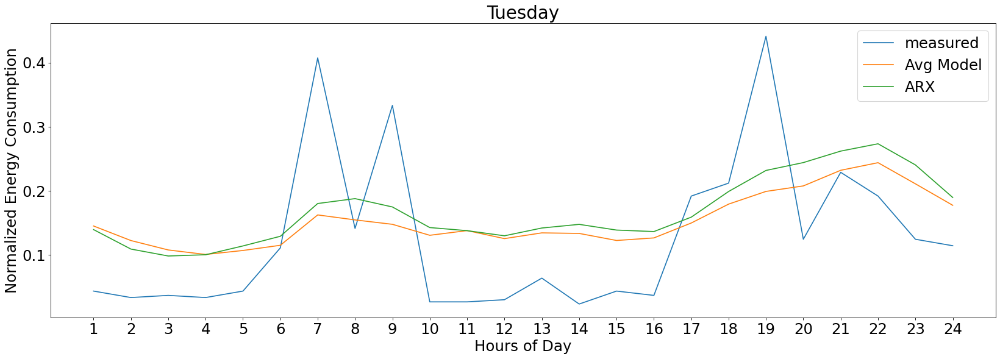

In [263]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['Arx'], label= 'ARX')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Tuesday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==3])):
    sum_er += abs(df_test[df_test['DoW']==3]['TestBldg'][2*n+i]-df_test[df_test['DoW']==3]['Arx'][2*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==3])
print('ARX MAE: ', MAE) 

### **Tuesday Plot**

ARX MAE:  0.10463924311371013


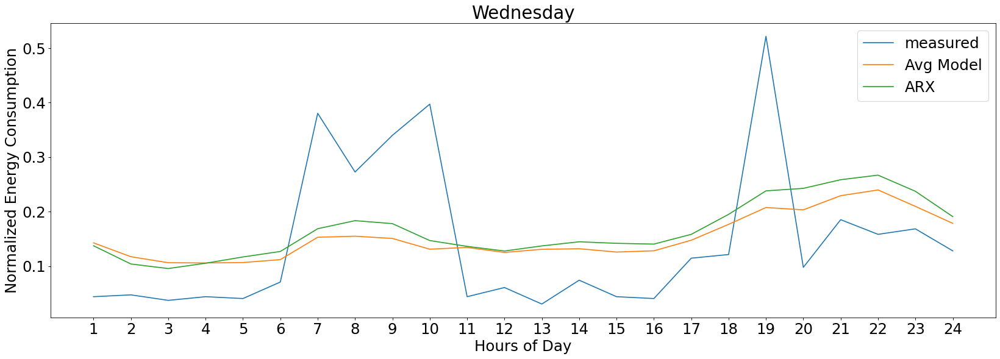

In [264]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['Arx'], label= 'ARX')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Wednesday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==4])):
    sum_er += abs(df_test[df_test['DoW']==4]['TestBldg'][3*n+i]-df_test[df_test['DoW']==4]['Arx'][3*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==4])
print('ARX MAE: ', MAE) 

### **Wednesday Plot**

ARX MAE:  0.06960716273201005


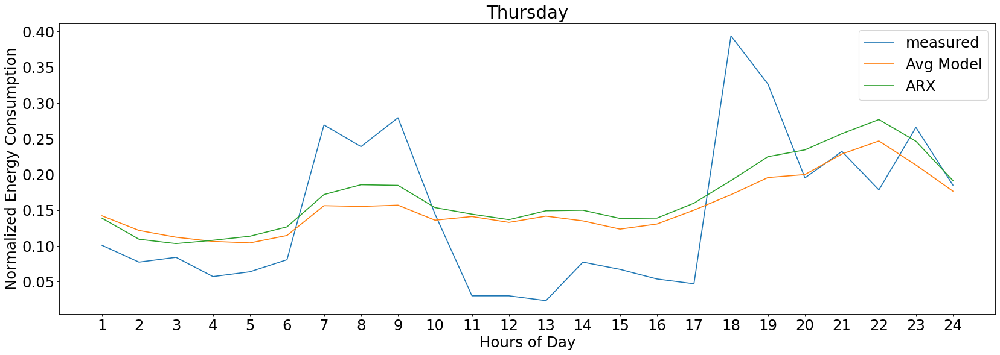

In [265]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['Arx'], label= 'ARX')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Thursday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==5])):
    sum_er += abs(df_test[df_test['DoW']==5]['TestBldg'][4*n+i]-df_test[df_test['DoW']==5]['Arx'][4*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==5])
print('ARX MAE: ', MAE) 

### **Thursday Plot**

ARX MAE:  0.08313523792217654


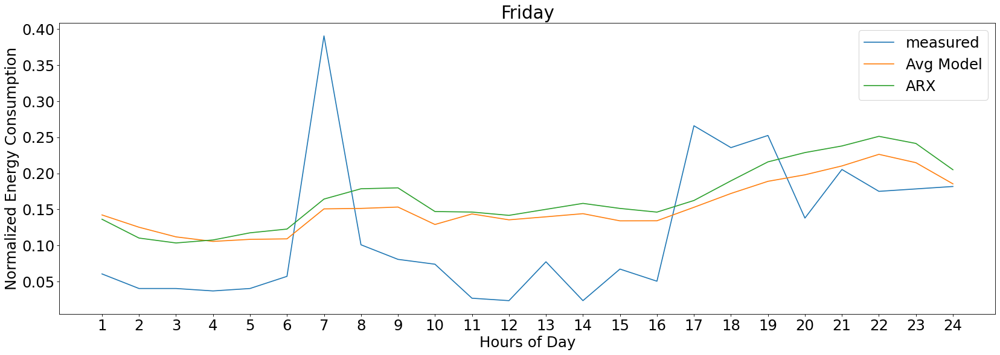

In [266]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['Arx'], label= 'ARX')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Friday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==6])):
    sum_er += abs(df_test[df_test['DoW']==6]['TestBldg'][5*n+i]-df_test[df_test['DoW']==6]['Arx'][5*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==6])
print('ARX MAE: ', MAE) 

### **Friday Plot**

ARX MAE:  0.09420492667377811


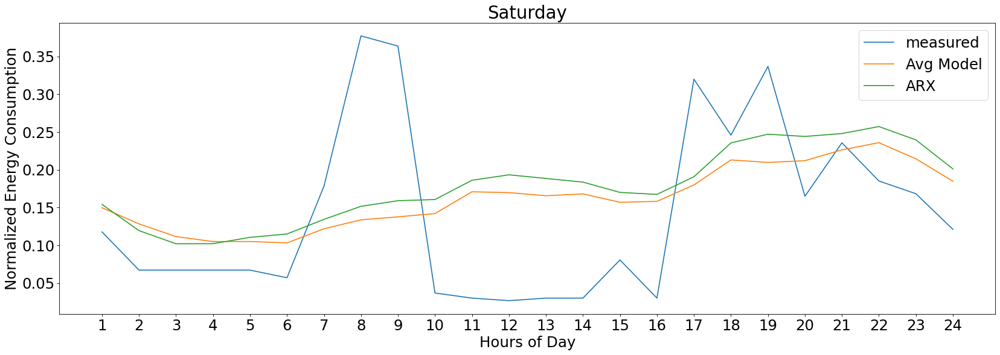

In [267]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['Arx'], label= 'ARX')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Saturday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==7])):
    sum_er += abs(df_test[df_test['DoW']==7]['TestBldg'][6*n+i]-df_test[df_test['DoW']==7]['Arx'][6*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==7])
print('ARX MAE: ', MAE) 

### **Saturday Plot**

In [212]:
sum_er = 0
for i in range(3,len(df_test)):
    sum_er += abs(df_test['TestBldg'][i]-df_test['Arx'][i])
    
MAE = sum_er/(len(df_test)-3)
print('ARX overall MAE: ', MAE)

ARX overall MAE:  0.0961908977029553


DoW with highest MAE: **Monday** 0.116


DoW with lowest MAE: **Thursday** 0.0696

## Problem 4

**(a)**

The input for this model is 
$x = \Phi^T = \begin{bmatrix} P(k-1) & P(k) & .. & P(k+163) \\ P(k-2) & P(k-1) & .. & P(k+162) \\ P(k-3) & P(k-2) & .. & P(k+161) \end{bmatrix}$ and y = Y 

Where,

$\Phi$ and $Y$ are the same as those in the previous problem and (i) represent the row number for $\Phi$ and $Y$

**(b)**

$\omega_1^{k+1} = \omega_1^k + \gamma \Sigma_{i=1}^m (y(i)-tanh(\omega^kx(i))(sech^2(\omega_1^kx_1(i)))$<br>
$\omega_2^{k+1} = \omega_2^k + \gamma \Sigma_{i=1}^m (y(i)-tanh(\omega^kx(i))(sech^2(\omega_2^kx_2(i)))$<br>
$\omega_3^{k+1} = \omega_3^k + \gamma \Sigma_{i=1}^m (y(i)-tanh(\omega^kx(i))(sech^2(\omega_3^kx_3(i)))$

In [271]:
import math
import mpmath

w = np.matrix([[0],[0],[0]])
iter = 1000

for steps in range(iter):
    ersum = 0
    Dj=0

    for i in range(1820):
        ersum += abs(Y[i]-math.tanh((w.T*phi[i].T).item(0)))
        Dj += 0.001*(Y[i]-math.tanh((w.T*phi[i].T).item(0)))*np.matrix([[(1/math.cosh(w.item(0)*phi[i].item(0)))**2, (1/math.cosh(w.item(1)*phi[i].item(1)))**2, (1/math.cosh(w.item(2)*phi[i].item(2)))**2]])

    w = w + Dj.T

w


matrix([[-2.95445092e-18],
        [-2.95445092e-18],
        [-2.95445092e-18]])

After 1000 iterations, $\omega_1^{\star}=-2.95x10^{-18}, \omega_2^{\star}=-2.95x10^{-18},$ and $\omega_3^{\star}=-2.95x10^{-18}$

**(d)**

In [272]:
NN = []
NN = [df_test['TestBldg'][0],df_test['TestBldg'][1],df_test['TestBldg'][2]]
for i in range(3, len(df_test)):
    NN.append(math.tanh((NN[i-1]*w[0]+NN[i-2]*w[1]+ NN[i-3]*w[2]).item(0)) + df_smodel.iloc[df_test['HoD'][i]-1,df_test['DoW'][i]-1])
df_test['NN']=NN
df_test

,TestTime,TestBldg,HoD,DoW,WoY,Pred,Arx,NN
0,9/7/14 00:00,0.094276,1,1,1,0.158667,0.094276,0.094276
1,9/7/14 01:00,0.037037,2,1,1,0.138553,0.037037,0.037037
2,9/7/14 02:00,0.040404,3,1,1,0.117410,0.040404,0.040404
3,9/7/14 03:00,0.037037,4,1,1,0.108281,0.102552,0.108281
4,9/7/14 04:00,0.037037,5,1,1,0.104420,0.132382,0.104420
...,...,...,...,...,...,...,...,...
163,9/13/14 19:00,0.164983,20,7,1,0.212035,0.244102,0.212035
164,9/13/14 20:00,0.235690,21,7,1,0.226399,0.247940,0.226399
165,9/13/14 21:00,0.185185,22,7,1,0.235849,0.257207,0.235849
166,9/13/14 22:00,0.168350,23,7,1,0.214539,0.239522,0.214539


NN MAE:  0.0873214029767382


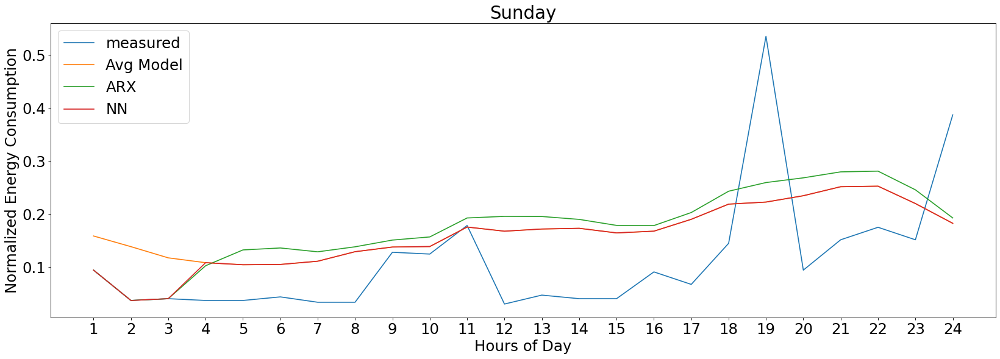

In [273]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['Arx'], label= 'ARX')
plt.plot(df_test[df_test['DoW']==1]['HoD'], df_test[df_test['DoW']==1]['NN'], label= 'NN')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Sunday')

sum_er = 0
n=0
for i in range(len(df_test[df_test['DoW']==1])):
    sum_er += abs(df_test[df_test['DoW']==1]['TestBldg'][i]-df_test[df_test['DoW']==1]['NN'][i])
    n+=1
    
MAE = sum_er/len(df_test[df_test['DoW']==1])
print('NN MAE: ', MAE) 

### **Sunday plot**

NN MAE:  0.11112996935724223


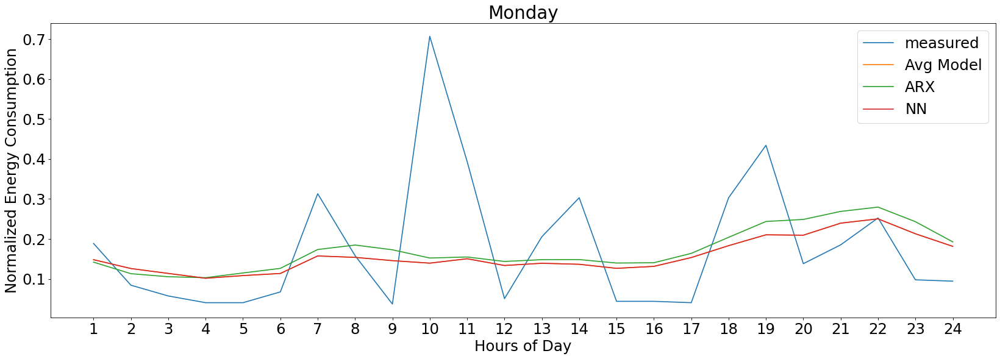

In [274]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['Arx'], label= 'ARX')
plt.plot(df_test[df_test['DoW']==2]['HoD'], df_test[df_test['DoW']==2]['NN'], label= 'NN')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Monday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==2])):
    sum_er += abs(df_test[df_test['DoW']==2]['TestBldg'][n+i]-df_test[df_test['DoW']==2]['NN'][n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==2])
print('NN MAE: ', MAE) 

### **Monday plot**

NN MAE:  0.08764351590582777


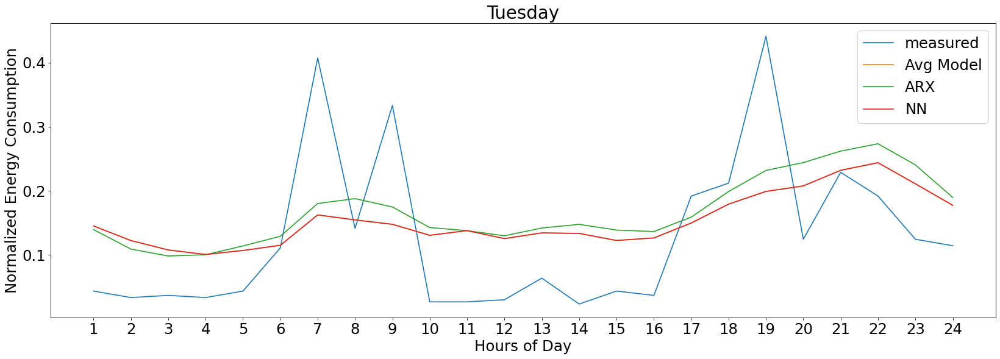

In [275]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['Arx'], label= 'ARX')
plt.plot(df_test[df_test['DoW']==3]['HoD'], df_test[df_test['DoW']==3]['NN'], label= 'NN')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Tuesday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==3])):
    sum_er += abs(df_test[df_test['DoW']==3]['TestBldg'][2*n+i]-df_test[df_test['DoW']==3]['NN'][2*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==3])
print('NN MAE: ', MAE) 

### **Tuesday plot**

NN MAE:  0.10069344896443289


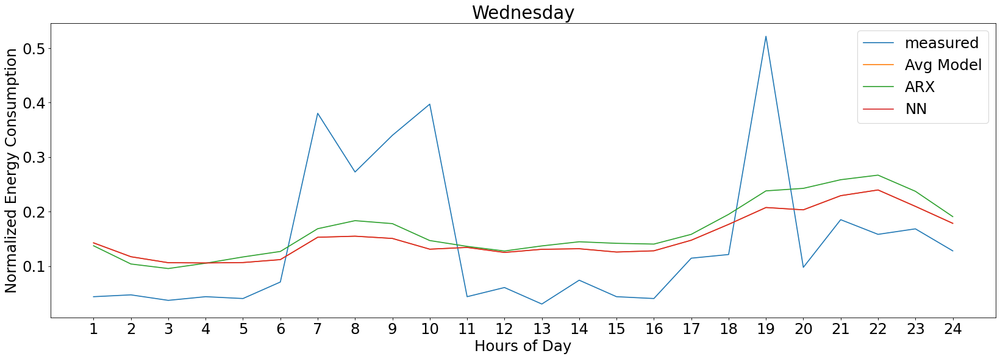

In [276]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['Arx'], label= 'ARX')
plt.plot(df_test[df_test['DoW']==4]['HoD'], df_test[df_test['DoW']==4]['NN'], label= 'NN')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Wednesday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==4])):
    sum_er += abs(df_test[df_test['DoW']==4]['TestBldg'][3*n+i]-df_test[df_test['DoW']==4]['NN'][3*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==4])
print('NN MAE: ', MAE) 

### **Wednesday plot**

NN MAE:  0.07006082528061262


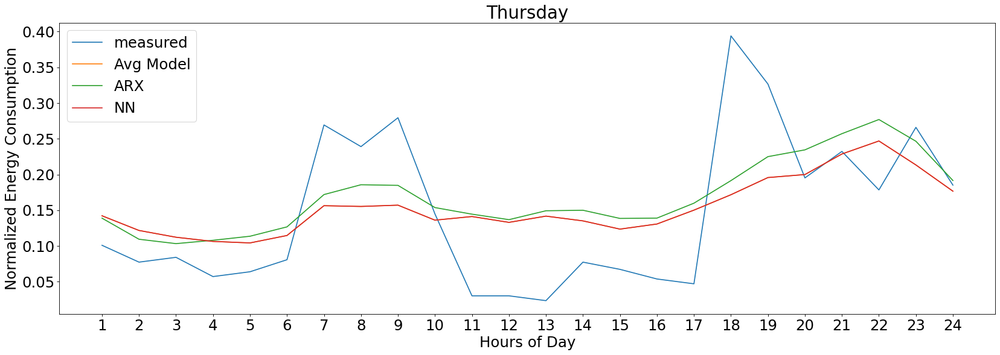

In [277]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['Arx'], label= 'ARX')
plt.plot(df_test[df_test['DoW']==5]['HoD'], df_test[df_test['DoW']==5]['NN'], label= 'NN')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Thursday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==5])):
    sum_er += abs(df_test[df_test['DoW']==5]['TestBldg'][4*n+i]-df_test[df_test['DoW']==5]['NN'][4*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==5])
print('NN MAE: ', MAE) 

### **Thursday plot**

NN MAE:  0.07514645920548045


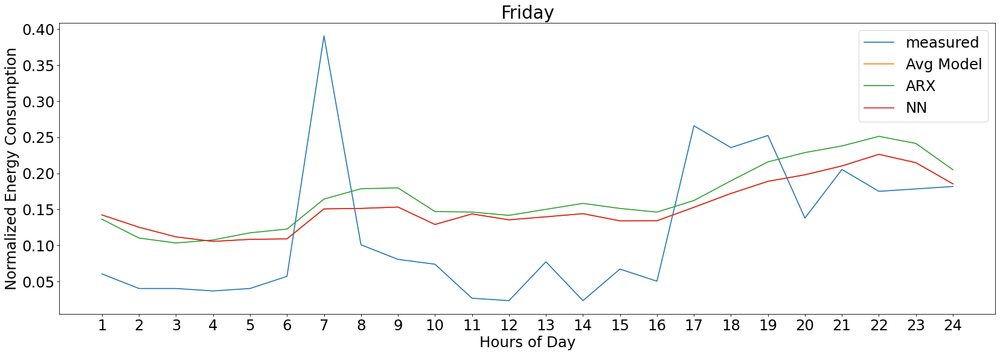

In [278]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['Arx'], label= 'ARX')
plt.plot(df_test[df_test['DoW']==6]['HoD'], df_test[df_test['DoW']==6]['NN'], label= 'NN')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Friday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==6])):
    sum_er += abs(df_test[df_test['DoW']==6]['TestBldg'][5*n+i]-df_test[df_test['DoW']==6]['NN'][5*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==6])
print('NN MAE: ', MAE)

### **Friday plot**

NN MAE:  0.09029475040204783


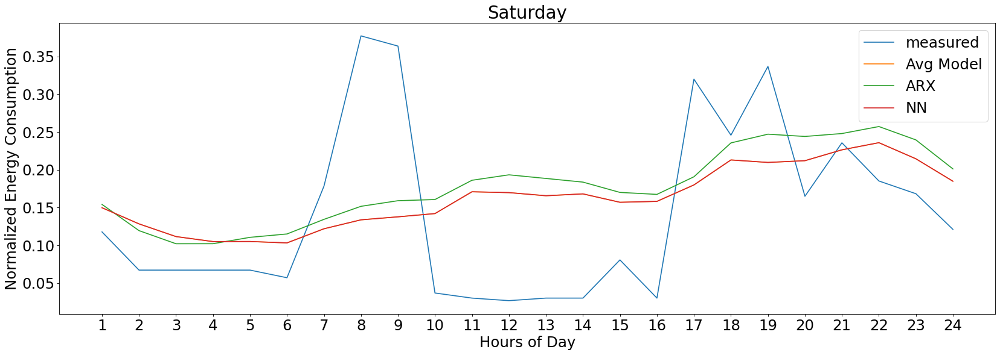

In [279]:
plt.figure(num=1, figsize=(25, 8), dpi=80, facecolor='w', edgecolor='k', )

plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['TestBldg'], label='measured')
plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['Pred'], label= 'Avg Model')
plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['Arx'], label= 'ARX')
plt.plot(df_test[df_test['DoW']==7]['HoD'], df_test[df_test['DoW']==7]['NN'], label= 'NN')
plt.legend()

j_idx=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]

plt.xticks(j_idx)
plt.xlabel('Hours of Day')
plt.ylabel('Normalized Energy Consumption')
plt.title('Saturday')

sum_er = 0
for i in range(len(df_test[df_test['DoW']==7])):
    sum_er += abs(df_test[df_test['DoW']==7]['TestBldg'][6*n+i]-df_test[df_test['DoW']==7]['NN'][6*n+i])
    
MAE = sum_er/len(df_test[df_test['DoW']==7])
print('NN MAE: ', MAE)

### **Saturday plot**

In [280]:
sum_er = 0
for i in range(3,len(df_test)):
    sum_er += abs(df_test['TestBldg'][i]-df_test['NN'][i])
    
MAE = sum_er/(len(df_test)-3)
print('NN overall MAE: ', MAE)

NN overall MAE:  0.09051496321343735


DoW with highest MAE: **Monday** 0.111


DoW with lowest MAE: **Thursday** 0.0701